In [3]:
from load import load_all_sis_data

# Load all data
all_flux_data, datetime_values, element_mapping = load_all_sis_data('flux_1998/')

print("All data shape:", all_flux_data.shape)
print("Element Mapping:", element_mapping)


# Compute lowerbound cutoffs:
import numpy as np
energy_level_to_compute = 1

# Precompute the Q1 values for each element
q1_values = {}
for element_name, element_index in element_mapping.items():
    valid_data_mask = (all_flux_data[energy_level_to_compute - 1, :, element_index] != -999.9) & (all_flux_data[energy_level_to_compute - 1, :, element_index] != 0)
    element_flux_for_stats = all_flux_data[energy_level_to_compute - 1, :, element_index][valid_data_mask]
    if len(element_flux_for_stats) > 0:
        q1_values[element_name] = np.percentile(element_flux_for_stats, 25)

# 3x multiplier for He and O to account for abundance
q1_values["He"] *= 3
q1_values["O"] *= 2.25
print(q1_values)

he_flux_threshold = q1_values["He"]

All data shape: (8, 140280, 6)
Element Mapping: {'C': 0, 'Fe': 1, 'He': 2, 'N': 3, 'O': 4, 'Si': 5}
{'C': 4.1736e-06, 'Fe': 1.6871e-06, 'He': 0.00010935, 'N': 3.4857e-06, 'O': 7.243424999999999e-06, 'Si': 2.3564e-06}


In [52]:
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter1d
from scipy.stats import linregress

def identify_exponential_decays(flux_data, time_data, window_size, slope_threshold):
    """
    Identifies exponential decay segments in flux data using linear regression.

    Args:
        flux_data (numpy.ndarray): Array of flux values.
        time_data (numpy.ndarray): Array of corresponding datetime values.
        window_size (int): Size of the sliding window for linear regression (in hours).
        slope_threshold (float): Threshold for the slope to identify a decay.

    Returns:
        list: List of tuples containing start and end times of decay segments.
    """
    flux_data = np.where(flux_data > 0, flux_data, np.nan)
    log_flux_data = np.log10(flux_data)
    log_flux_data = gaussian_filter1d(log_flux_data, sigma=1)

    decays = []
    for i in range(len(log_flux_data) - window_size):
        window = log_flux_data[i:i + window_size]
        if np.isnan(window).any():
            continue
        slope, intercept, r_value, p_value, std_err = linregress(np.arange(window_size), window)
        if slope < slope_threshold:
            start_time = time_data[i]
            end_time = time_data[i + window_size - 1]
            decays.append((start_time, end_time))

    merged_decays = []
    for start, end in decays:
        if merged_decays and start <= merged_decays[-1][1] + (time_data[1] - time_data[0]):
            merged_decays[-1] = (merged_decays[-1][0], max(merged_decays[-1][1], end))
        else:
            merged_decays.append((start, end))

    return merged_decays

def count_elements_decaying_in_window(data_3d, datetime_values, element_mapping, energy_level, start_time, end_time, window_size, slope_threshold):
    """
    Counts the number of elements with exponential decays within a given time window.
    
    Args:
        data_3d (numpy.ndarray): The 3D data cube (energy, time, element).
        datetime_values (numpy.ndarray): Array of datetime objects.
        element_mapping (dict): Element name to array index mapping.
        energy_level (int): The energy level to analyze.
        start_time (pd.Timestamp): Start time for the time window.
        end_time (pd.Timestamp): End time for the time window.
        window_size (int): Size of the sliding window for decay detection (in hours).
        slope_threshold (float): Threshold for the slope to identify a decay.

    Returns:
        set: The set of elements that decay within the time window.
    """
    time_mask = (datetime_values >= start_time) & (datetime_values <= end_time)
    decaying_elements = set()

    for element_name, element_index in element_mapping.items():
        if element_name == 'He':
            continue

        element_flux = data_3d[energy_level - 1, time_mask, element_index]
        valid_data_mask = element_flux != -999.9
        element_flux = element_flux[valid_data_mask]
        element_time = datetime_values[time_mask][valid_data_mask]

        if len(element_flux) == 0:
            continue

        decays = identify_exponential_decays(element_flux, element_time, window_size=18, slope_threshold=slope_threshold)
        if len(decays) > 0:
            decaying_elements.add(element_name)

    return decaying_elements

def compute_decay_events_for_all_data(data_3d, datetime_values, element_mapping, energy_level, he_flux_threshold, min_duration_hours, window_size, slope_threshold):
    """
    Computes decay events for all available data, keeping only events where helium flux stays above the threshold
    for the specified duration, and counts the number of elements with exponential decays in each window.
    
    Args:
        data_3d (numpy.ndarray): The 3D data cube (energy, time, element).
        datetime_values (numpy.ndarray): Array of datetime objects.
        element_mapping (dict): Element name to array index mapping.
        energy_level (int): The energy level to analyze.
        he_flux_threshold (float): Minimum helium flux threshold.
        min_duration_hours (int): Minimum duration (hours) above threshold.
        window_size (int): Size of the sliding window for decay detection (in hours).
        slope_threshold (float): Threshold for the slope to identify a decay.

    Returns:
        pd.DataFrame: DataFrame with decay event details including the number of elements decaying and non-decaying elements.
    """
    helium_index = element_mapping['He']
    helium_flux = data_3d[energy_level - 1, :, helium_index]
    
    valid_data_mask = helium_flux != -999.9
    helium_flux = helium_flux[valid_data_mask]
    helium_time = datetime_values[valid_data_mask]
    
    if len(helium_flux) == 0:
        print("No valid helium data available.")
        return pd.DataFrame()
    
    decay_segments = identify_exponential_decays(helium_flux, helium_time, window_size, slope_threshold)
    decay_event_details = []

    all_elements = set(element_mapping.keys()) - {'He'}

    for event_number, (start, end) in enumerate(decay_segments):
        start_index = np.where(helium_time == start)[0][0]
        end_index = np.where(helium_time == end)[0][0]

        above_threshold_mask = helium_flux[start_index:end_index] >= he_flux_threshold
        above_threshold_times = helium_time[start_index:end_index][above_threshold_mask]

        duration_above_threshold = 0
        if len(above_threshold_times) > 1:
            time_differences = np.diff(above_threshold_times)
            continuous_periods = np.where(time_differences <= pd.Timedelta(hours=1))[0]
            if len(continuous_periods) > 0:
                duration_above_threshold = (
                    above_threshold_times[continuous_periods[-1] + 1] - above_threshold_times[0]
                ).total_seconds() / 3600

        decaying_elements = count_elements_decaying_in_window(
            data_3d, datetime_values, element_mapping, energy_level, start, end, window_size, slope_threshold
        )

        non_decaying_elements = all_elements - decaying_elements
        non_decaying_elements_list = list(non_decaying_elements)

        if duration_above_threshold >= min_duration_hours:
            start_year = start.year
            end_year = end.year
            start_frac_day = (
                start.timetuple().tm_yday
                + start.hour / 24
                + start.minute / 1440
                + start.second / 86400
            )
            end_frac_day = (
                end.timetuple().tm_yday
                + end.hour / 24
                + end.minute / 1440
                + end.second / 86400
            )
            start_hour = start.hour + start.minute / 60 + start.second / 3600
            end_hour = end.hour + end.minute / 60 + end.second / 3600

            decay_event_details.append(
                {
                    "Event Number": event_number + 1,
                    "Start Year": start_year,
                    "End Year": end_year,
                    "Start Fractional Day": start_frac_day,
                    "End Fractional Day": end_frac_day,
                    "Start Hour": start_hour,
                    "End Hour": end_hour,
                    "Elements Decaying": len(decaying_elements) + 1,
                    "Non-Decaying Elements": non_decaying_elements_list
                }
            )

    decay_events_df = pd.DataFrame(decay_event_details)
    return decay_events_df

# Parameters
energy_level_to_compute = 1
min_duration_hours = 48
window_size = 24  # hours
slope_threshold = -0.005

# Compute decay events with the new parameters
decay_events_df = compute_decay_events_for_all_data(all_flux_data, datetime_values, element_mapping, energy_level_to_compute, he_flux_threshold, min_duration_hours, window_size, slope_threshold)

# Fix columns from wrapping
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')

print(decay_events_df)


     Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements
0           1         1998       1998          26.791655            30.291655       18.999722   6.999722          1            [N, O, Fe, Si, C] 
1           8         1998       1998         100.250000           105.374988        6.000000   8.999722          1            [N, O, Fe, Si, C] 
2           9         1998       1998         105.458322           109.375000       10.999722   9.000000          1            [N, O, Fe, Si, C] 
3          10         1998       1998         112.000000           118.624988        0.000000  14.999722          6                           [] 
4          11         1998       1998         120.124988           129.291667        2.999722   7.000000          6                           [] 
..            ...         ...       ...                   ...                 ...         ...        ...                ... 

     Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements
0          10         1998       1998         112.000000           118.624988        0.000000  14.999722          6                      []      
1          11         1998       1998         120.124988           129.291667        2.999722   7.000000          6                      []      
2          12         1998       1998         129.624988           136.125000       14.999722   3.000000          6                      []      
3          21         1998       1998         168.833322           173.374988       19.999722   8.999722          4                [Fe, Si]      
4          37         1998       1998         237.874988           244.666667       20.999722  16.000000          6                      []      
..            ...         ...       ...                   ...                 ...         ...        ...                ... 

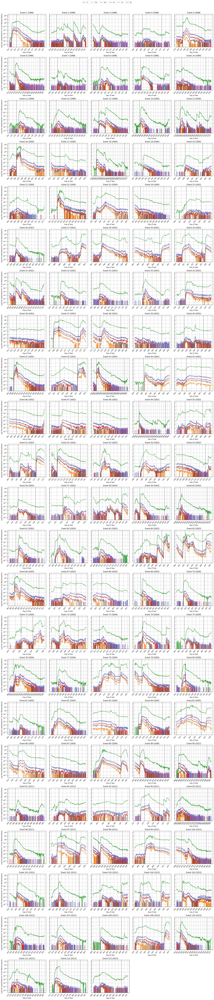

In [7]:
def filter_by_elements_decaying(decay_events_df, min_elements_decaying_list):
    # Filter the DataFrame based on any of the minimum thresholds
    filtered_df = decay_events_df[decay_events_df['Elements Decaying'].isin(min_elements_decaying_list)]

    # Reset the index of the filtered DataFrame
    filtered_df = filtered_df.reset_index(drop=True)
    return filtered_df

min_elements_decaying_list = [4, 5, 6]  # Set the thresholds for elements decaying
filtered_df = filter_by_elements_decaying(decay_events_df, min_elements_decaying_list)

print(filtered_df)



from graph import plot_all_decay_events

energy_level_to_plot = 1
extend_days = 2  # Adjust the number of days to extend before and after
print(f"Graph of flux events using data from energy level {energy_level_to_plot} and using data from Helium at energy level {energy_level_to_compute} for cutoffs")
plot_all_decay_events(filtered_df, all_flux_data, datetime_values, element_mapping, energy_level_to_plot, extend_days, True)


In [53]:
import numpy as np
import pandas as pd
from features import create_dataframe

test_decay_df = create_dataframe(decay_events_df, datetime_values, all_flux_data, element_mapping, 0)
test_decay_df = test_decay_df.drop(test_decay_df.columns[-1], axis=1)

test_decay_df.to_csv("out_csv/decay_test_features_1998.csv", index=False)
# print(test_decay_df)


c:\Users\jeffr\OneDrive\Documents\SURF2024\features.py:50: RuntimeWarning: Mean of empty slice
  avg_decay_percentages = np.nanmean(


In [54]:
import pandas as pd
import joblib

# Load the model and scaler from the joblib files
model_filename = 'mlp_model/model_best.joblib'
scaler_filename = 'mlp_model/scaler_best.joblib'
loaded_model = joblib.load(model_filename)
loaded_scaler = joblib.load(scaler_filename)

# Load the new dataset (assuming the same format as the original, without the target column)
new_data_file_path = 'transformed_data/decay_test_features_1998.csv'
new_df = pd.read_csv(new_data_file_path)

# Define the column name for Event ID (replace 'Event ID' if different)
event_id_col = 'Event ID'

# Preprocess the new data (handle any missing values, etc.)
new_df.fillna(0, inplace=True) 
print(new_df.shape)

# **Map Event ID to predictions using merge (assuming index is preserved)**
new_df_with_id = new_df.copy()  # Copy to avoid modifying original DataFrame
new_df_with_id['Event ID'] = new_df_with_id[event_id_col]  # Add Event ID column for predictions

# Ignore the Event ID column before scaling
ignored_cols = [event_id_col]
new_df_for_model = new_df_with_id.drop(columns=ignored_cols)  # New DataFrame for model

# Transform the new data using the loaded scaler
new_data_scaled = loaded_scaler.transform(new_df_for_model)

# Predict the target flag using the loaded model
new_predictions = loaded_model.predict(new_data_scaled)

# Add the predictions as a new column to the DataFrame with Event ID
new_df_with_id['Predicted Target'] = new_predictions

# Save the new DataFrame with predictions and Event ID to a new CSV file
output_file_path = 'transformed_data/decay_test_predictions.csv'
new_df_with_id.to_csv(output_file_path, index=False)

# Print the DataFrame with predictions (original DataFrame with predictions and Event ID)
print(new_df_with_id)


(8952, 18)
      Event ID  Element  Duration  Max Flux  Initial Decay Rate  Average Decay Rate  Time to Peak  Peak Prominence  Number of Peaks  Skewness  Kurtosis     Std Flux    Median Flux  Normalized Time to Peak  Decay Rate 25%  Decay Rate 50%  Decay Rate 75%  Avg Decay Percentages  Predicted Target
0          1       0        96     0.000008     0.000000e+00        0.000000e+00           7          0.000008             7         3.066694   9.153997  1.455463e-06   0.000000           0.072917           0.000000e+00    0.000000e+00    0.000000e+00       0.000000e+00               0       
1          1       0        96     0.000003     1.387500e-07        3.468750e-08           0          0.000003            11         2.143288   2.618143  1.044158e-06   0.000000           0.000000           1.387500e-07    6.937500e-08    4.625000e-08       8.479167e-08               0       
2          1       0        96     0.000004     0.000000e+00        0.000000e+00           9          0.000

In [55]:
import pandas as pd
selected_df = new_df_with_id[['Event ID', 'Element', 'Predicted Target']]
print(selected_df)

      Event ID  Element  Predicted Target
0          1       0             0       
1          1       0             0       
2          1       0             0       
3          1       0             0       
4          1       1             0       
...        ...      ...               ...
8947     640       4             1       
8948     640       5             0       
8949     640       5             0       
8950     640       5             0       
8951     640       5             0       

[8952 rows x 3 columns]


In [56]:
import pandas as pd

# Element mapping
reverse_mapping = {v: k for k, v in element_mapping.items()}

# Add new columns to decay_events_df for each element
for element in element_mapping.keys():
    decay_events_df[f'Num Targets {element}'] = 0

# Iterate through selected_df to count the number of 1s for each element for each event ID
for event_id, element, target in selected_df.values:
    element_name = reverse_mapping[element]
    if target == 1:
        decay_events_df.loc[decay_events_df['Event Number'] == event_id, f'Num Targets {element_name}'] += 1

# Display the updated decay_events_df
print(decay_events_df)


     Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements  Num Targets C  Num Targets Fe  Num Targets He  Num Targets N  Num Targets O  Num Targets Si
0           1         1998       1998          26.791655            30.291655       18.999722   6.999722          1            [N, O, Fe, Si, C]         0               0               1              0              4               0      
1           8         1998       1998         100.250000           105.374988        6.000000   8.999722          1            [N, O, Fe, Si, C]         3               0               0              2              4               0      
2           9         1998       1998         105.458322           109.375000       10.999722   9.000000          1            [N, O, Fe, Si, C]         0               0               0              0              3               0      
3          10         1998       1998       

In [57]:
from IPython.display import display, HTML

# Create temp column for totals
decay_events_df['Total Targets'] = decay_events_df.iloc[:, 9:].sum(axis=1)
priority_order = ['Num Targets Fe', 'Num Targets Si', 'Num Targets N', 'Num Targets C', 'Num Targets O', 'Num Targets He']

# Sort the DataFrame and drop temporary total
sorted_df = decay_events_df.sort_values(by=['Total Targets'] + priority_order, ascending=[False] + [False] * len(priority_order))
sorted_df = sorted_df.drop(columns=['Total Targets'])

print(sorted_df)
# Create a scrollable HTML table
# scrollable_table = f"""
# <div style="max-height: 400px; overflow-y: scroll; border: 1px solid black; padding: 10px;">
#     {sorted_df.to_html(index=False)}
# </div>
# """
# display(HTML(scrollable_table))


     Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements  Num Targets C  Num Targets Fe  Num Targets He  Num Targets N  Num Targets O  Num Targets Si
3          10         1998       1998         112.000000           118.624988        0.000000  14.999722          6                           []         4               4               4              4              4               4      
5          12         1998       1998         129.624988           136.125000       14.999722   3.000000          6                           []         4               4               4              4              4               4      
16         37         1998       1998         237.874988           244.666667       20.999722  16.000000          6                           []         4               4               4              4              4               4      
21         43         1998       1998       

    Event Number  Start Year  End Year  Start Fractional Day  End Fractional Day  Start Hour  End Hour   Elements Decaying Non-Decaying Elements  Num Targets C  Num Targets Fe  Num Targets He  Num Targets N  Num Targets O  Num Targets Si
0         10         1998       1998         112.000000           118.624988        0.000000  14.999722          6                        []            4               4               4              4              4               4      
1         12         1998       1998         129.624988           136.125000       14.999722   3.000000          6                        []            4               4               4              4              4               4      
2         37         1998       1998         237.874988           244.666667       20.999722  16.000000          6                        []            4               4               4              4              4               4      
3         43         1998       1998         273

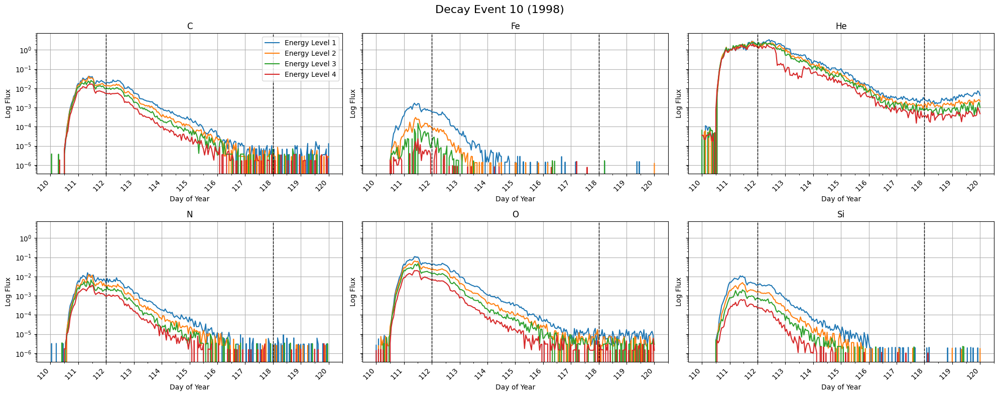

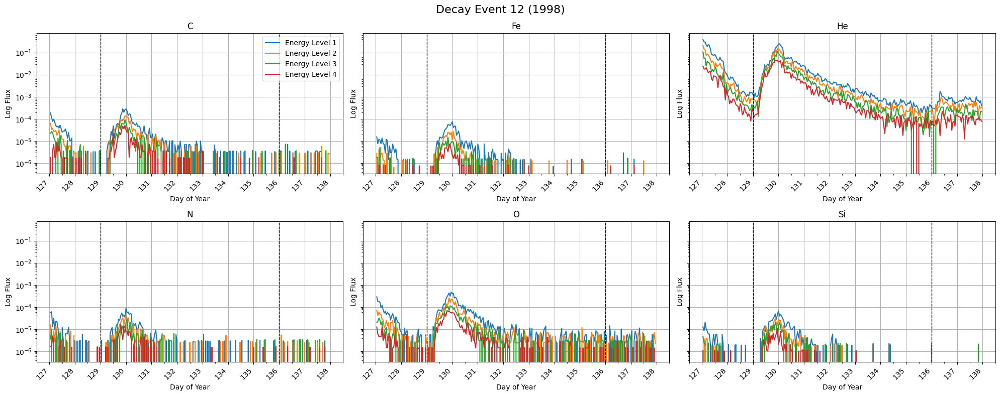

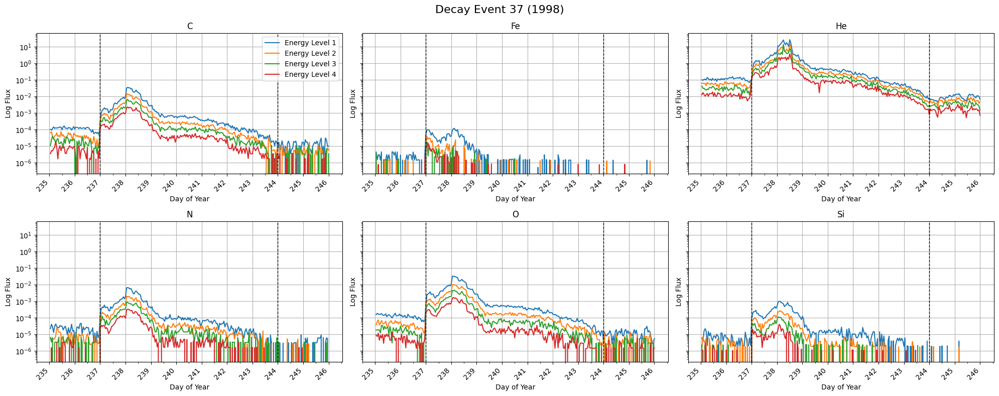

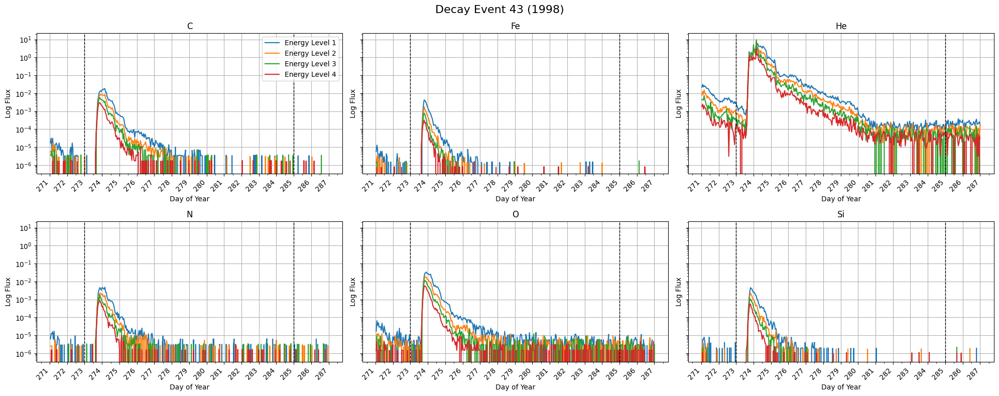

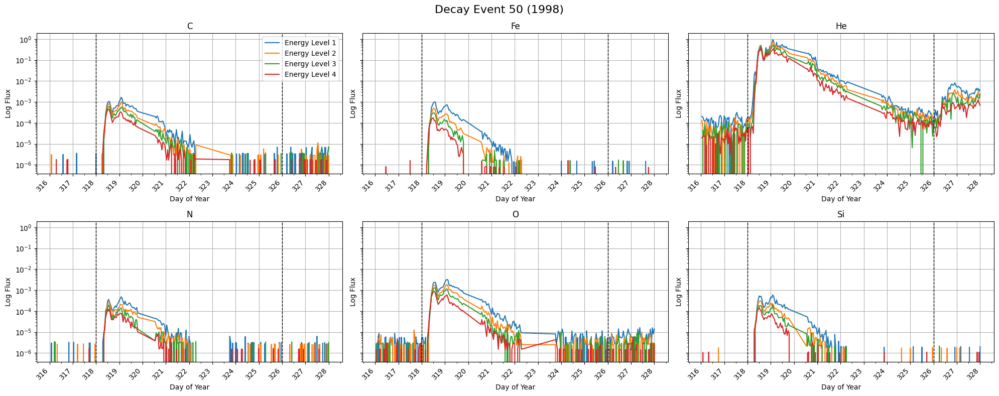

...

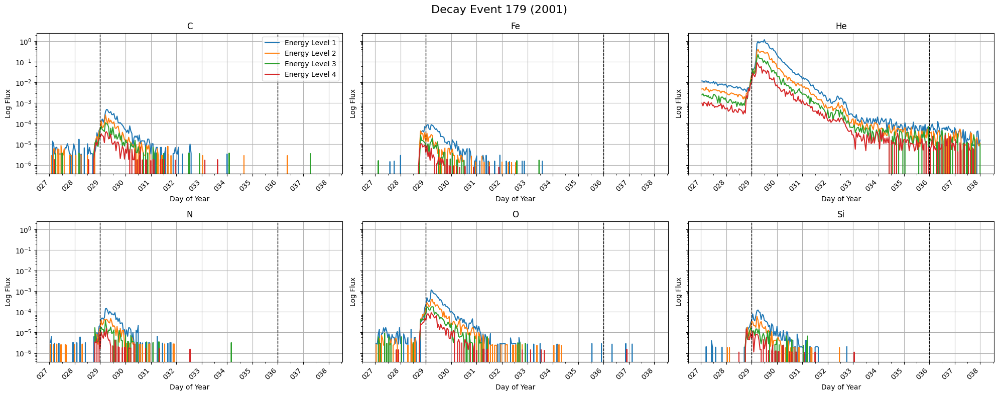

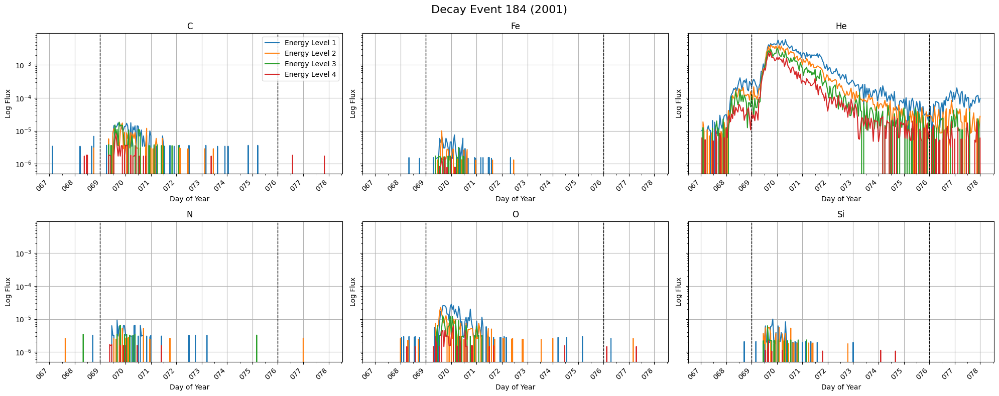

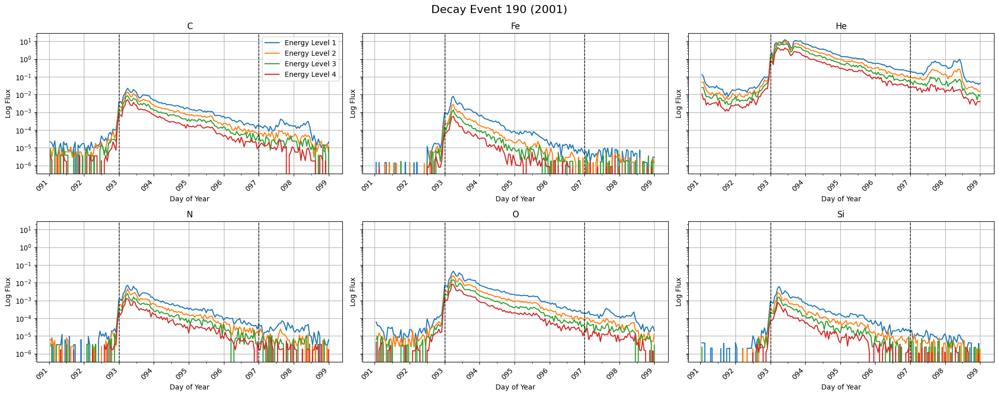

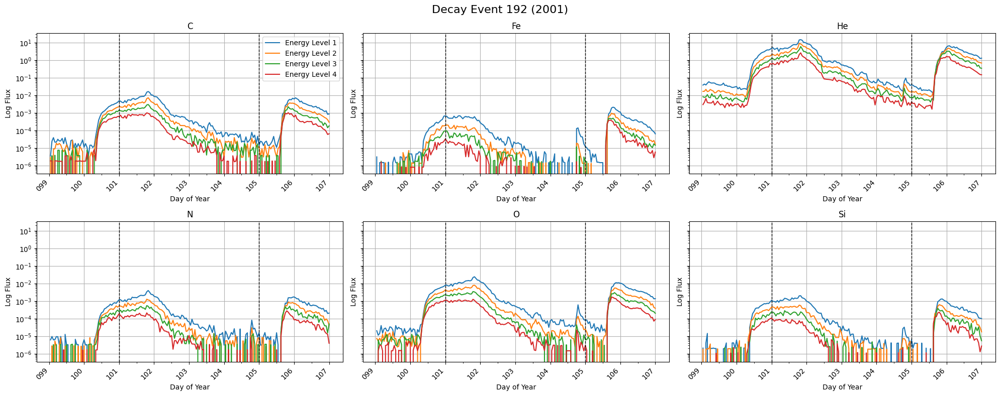

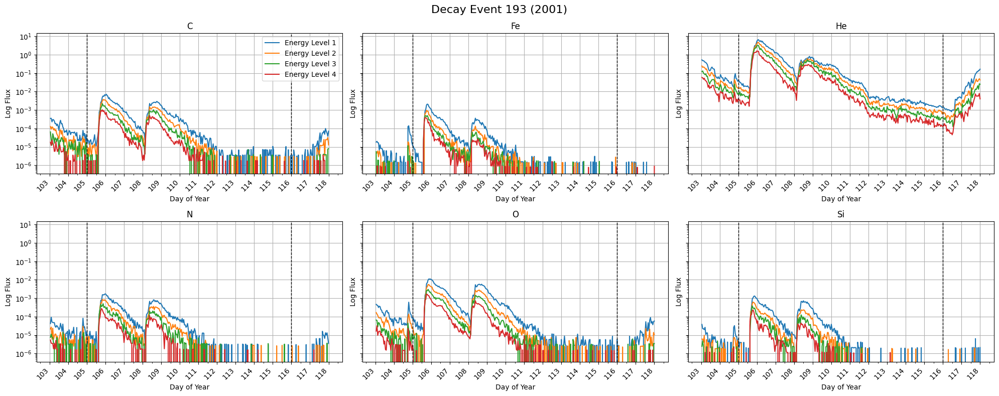

In [63]:
import pandas as pd

top_10_df = sorted_df.iloc[:20]  # Use .loc if you have custom indexing
top_10_df = top_10_df.reset_index(drop=True)

print(top_10_df)

from graph import plot_decay_events_per_element, plot_all_decay_events

# Parameters
energy_levels_to_plot = 4  # Number of lowest energy levels to plot
extend_days = 2  # Extend the time range by 2 days before and after the event
useLogScale = True  # Whether to use a logarithmic scale for the y-axis

# Plot the decay events
plot_decay_events_per_element(top_10_df, all_flux_data, datetime_values, element_mapping, energy_levels_to_plot, extend_days, useLogScale)
# plot_all_decay_events(top_10_df, all_flux_data, datetime_values, element_mapping, energy_levels_to_plot, extend_days, useLogScale)
